# Introduction of ATHENA

ATHENA is a computational framework to analyze spatial heterogeneity in spatial single-cell omics data.


## Overview ATHENA
1. Spatially resolved omics measurements are acquired, resulting in highly dimensional images.

2. If necessary (for IMC, MIBI) images are segmented into single cells (cellmasks) and single cell expression values are extracted. Based on the single cell expression values, cells are classified into different type, aka phenotyping.

3. Cellmasks are used to construct a graph representation of the data. The framework currently supports three flavours (radius, knn, contact) that we will showcase later in this tutorial

4. The framework provides a variety of methods to quantify the observed diversity in samples. Furthermore, methods to analyse the interaction strength of different phenotypes are provided. 

5. The quantification methods can be used to featurise samples, this featurization can be used in downstream ML models to stratify patients and to discover new biomarkers.


![overview.png](img/overview.png)

### Submoduls
The ATHENA framework is structured in several submodules to perform tasks

- *pl* for plotting
- *graph* for graph construction
- *pp* for pre-processing
- *metrics* for quantification
- *neigh* for neighborhood quantification

## Environment set up

In [1]:
import pandas as pd
from tqdm import tqdm
import spatialHeterogeneity as sh

pd.set_option('display.max_columns', 5)

## Load pre-computed data

In [2]:
# load IMC data set form Jackson __et al.__
so = sh.dataset.imc()
so.spl = so.spl.loc[so.X.keys()]  # only keep meta data for samples with expression data
so

INFO:numexpr.utils:NumExpr defaulting to 8 threads.



        SpatialOmics object with
        8 samples
        

## Visualise raw images
To visualise the high-dimensional raw images we use the python image viewer napari.
Run the cell below and explore the visualised raw image with the viewer (more information on https://napari.org/#).
In addition to the single protein expression levels, we also add segmentations masks (with `add_masks`) for the single cells and the tumor-stroma borders.

In [3]:
spl = 'SP43_116_X3Y4'
proteins = ['DNA2', 'CarbonicAnhydraseIX', 'EGFR', 'CD45', 'Fibronectin', 'p53']
sh.pl.napari_viewer(so, spl, attrs=proteins, add_masks=so.masks[spl].keys())

/usr/local/Caskroom/miniconda/base/envs/spatial-heterogeneity/lib/python3.8/site-packages/napari/_vispy/vispy_camera.py:109: RuntimeWarning: divide by zero encountered in true_divide
  zoom = np.min(canvas_size / scale)


## Visualise Omics data
In this section we visualise the proteomics measurements of the single cells. But first we set up a colormap that we save in the `uns` attribute of our `SpatialOmics` instance. The plotting modules looks up colormaps in the `uns` attribute when plotting certain features of the data. If there is no colormap for a given attribute the plotting module uses the ```default``` colormap. The dataset already comes with a phenotype for each single cell (`meta_id` in obs) and a more coares classification into cell types (`cell_type_id` in obs).

In [4]:
from matplotlib import cm
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np

so.uns = {'cmaps': {}, 'cmap_labels': {}}

# define default colormap
so.uns['cmaps'].update({'default': cm.Reds})

# set up colormaps for meta_id
cmap_paper = np.array([[255, 255, 255], [10, 141, 66], [62, 181, 86], [203, 224, 87],  # 0 1 2 3
                       [84, 108, 47], [180, 212, 50], [23, 101, 54],  # 4 5 6
                       [248, 232, 13], [1, 247, 252], [190, 252, 252],  # 7 8 9
                       [150, 210, 225], [151, 254, 255], [0, 255, 250],  # 10 11 12
                       [154, 244, 253], [19, 76, 144], [0, 2, 251],  # 13 14 15
                       [147, 213, 198], [67, 140, 114], [238, 70, 71],  # 16 17 18
                       [80, 45, 143], [135, 76, 158], [250, 179, 195],  # 19 20 21
                       [246, 108, 179], [207, 103, 43], [224, 162, 2],  # 22 23 24
                       [246, 131, 110], [135, 92, 43], [178, 33, 28]])

# define labels for meta_id
cmap_labels = {22: 'CK low HR low',
               4: 'Macrophages',
               10: 'Small elongated',
               3: 'T cell',
               2: 'B and T cells',
               9: 'Small circular',
               25: 'HR low CK',
               5: 'T cell',
               16: 'Proliferative',
               7: 'Endothelial',
               21: 'Epithelial low',
               24: 'CK HR',
               8: 'Vimentin Hi',
               14: 'Hypoxic',
               11: 'Fibronectin Hi',
               23: 'HR hi CK',
               1: 'B cells',
               20: 'CK7 CK',
               13: 'SMA Hi Vimentin',
               15: 'Apopotic',
               18: 'Basal CK',
               19: 'CK7 CK hi Cadherin',
               17: 'p53 EGFR',
               12: 'Larger elongated',
               27: 'Myoepithalial',
               26: 'CK low HR hi p53',
               6: 'Macrophages',
               0: 'Background'}

so.uns['cmaps'].update({'meta_id': ListedColormap(cmap_paper / 255)})
so.uns['cmap_labels'].update({'meta_id': cmap_labels})

# cell_type_id colormap
cmap = ['white', 'darkgreen', 'gold', 'steelblue', 'darkred', 'coral']
cmap_labels = {0: 'background', 4: 'tumor', 5: 'myoepithelial', 1: 'immune', 2: 'endothelial', 3: 'stromal'}
cmap = ListedColormap(cmap)

so.uns['cmaps'].update({'cell_type_id': cmap})
so.uns['cmap_labels'].update({'cell_type_id': cmap_labels})

The plotting function `pl.spatial` can be used to visualise the spatial omics measurements.
The minimal function arguments are the SpatialOmics instance and the sample to visualise. By default the observations are plotted as a scatter plot, however, with `mode=mask` the actuall segmentation masks are used. The observations can be colored according to a specific feature in either `so.obs[spl]` or `so.X[spl]`.

In order to plot the observation in scatter mode we first need to extract the centroids of the provided segmentation masks. This dataset provides two different segmentations for each sample, the segmentation into single cells ('cellmasks') and the segmentation into tumor-stroma regions ('tumor_stroma'). For the visualisation we would like to extract the centroids from the single cells, as shown below

In [5]:
spl = 'SP43_116_X3Y4'
print(so.masks[spl].keys())

# extract centroids for observations in all samples
for spl in so.obs.keys():
    sh.pp.extract_centroids(so,spl, mask_key='cellmasks')

dict_keys(['cellmasks', 'tumor_stroma'])


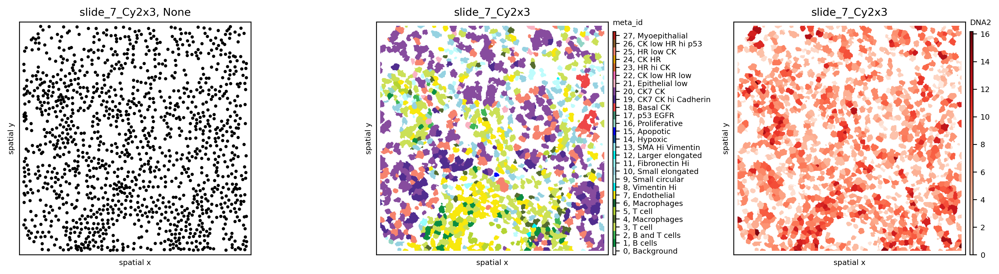

In [6]:
spl = 'slide_7_Cy2x3'

fig, axs = plt.subplots(1, 3, figsize=(13, 6), dpi=300)
sh.pl.spatial(so, spl, None, ax=axs.flat[0])
sh.pl.spatial(so, spl, 'meta_id', mode='mask', ax=axs.flat[1])
sh.pl.spatial(so, spl, 'DNA2', mode='mask', ax=axs.flat[2])

## Graph construction
The framework supports three differnt graph builders

**kNN**: Conncets each observation with its _k_ closest neighbors

**radius**: Connects a observation to all other observations within a radius _r_

**contact**: Connects observations that "touch" each other. In a frist step a mask is enlarged by dilation. All other masks that now overlap with this enlarged version are connected.

![dilation.png](img/dilation.png)

In [7]:
# import default graph builder parameters
from spatialHeterogeneity.graph_builder.constants import GRAPH_BUILDER_DEFAULT_PARAMS

spl = 'slide_7_Cy2x3'

# KNN graph
config = GRAPH_BUILDER_DEFAULT_PARAMS['knn']
config['builder_params']['n_neighbors'] = 6
sh.graph.build_graph(so, spl, builder_type='knn', mask_key='cellmasks', config=config)
# sh.graph.build_graph(so, spl, builder_type='knn', mask_key='cellmasks')  #  run with default graph builder parameters

# radius graph
config = GRAPH_BUILDER_DEFAULT_PARAMS['radius']
config['builder_params']['radius'] = 36
sh.graph.build_graph(so, spl, builder_type='radius', mask_key='cellmasks', config=config)

# contact graph, this takes some time
sh.graph.build_graph(so, spl, builder_type='contact', mask_key='cellmasks')

100%|██████████| 1369/1369 [00:18<00:00, 75.00it/s]


### Visualise Graphs
In a next step we use the plotting submodule to visualise the computed graphs.

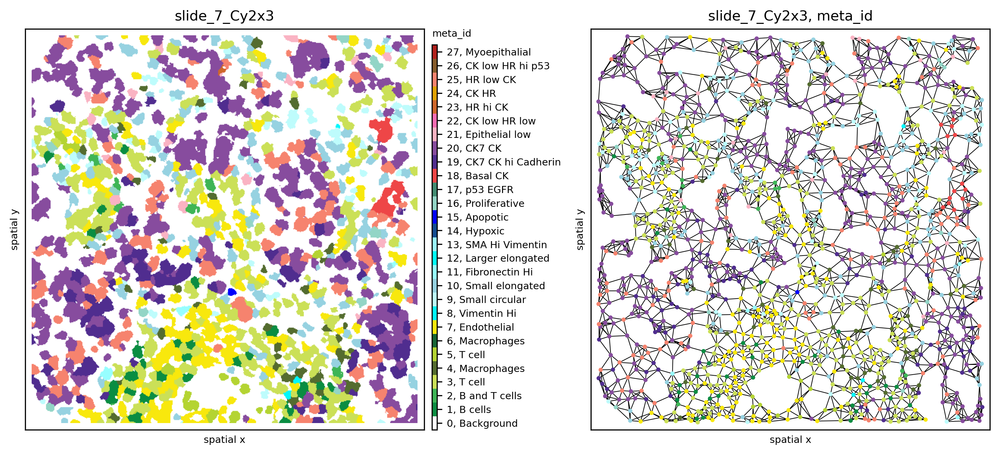

In [8]:
# plot graphs
attr = 'meta_id'
spl = 'slide_7_Cy2x3'

fig, axs = plt.subplots(1, 2, figsize=(10, 6), dpi=300)
sh.pl.spatial(so, spl, attr, mode='mask', ax=axs.flat[0])
sh.pl.spatial(so, spl, attr, edges=True, graph_key='knn', ax=axs.flat[1], cbar=False)

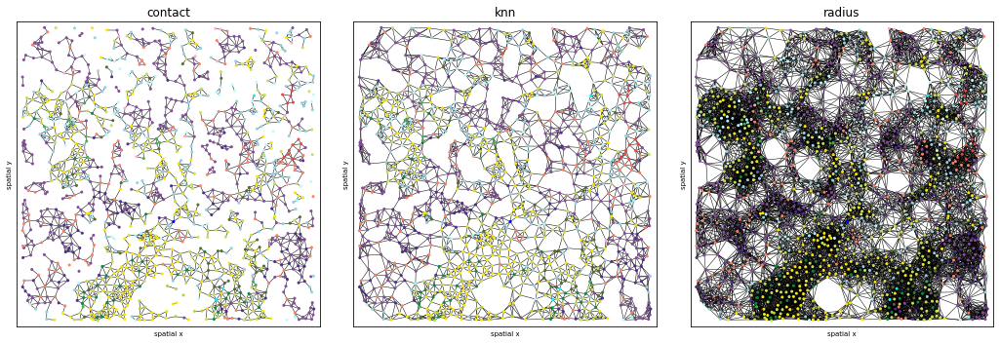

In [9]:
spl = 'slide_7_Cy2x3'
fig, axs = plt.subplots(1,3, figsize=(15,5))

# visualise different graphs for the samples
for ax, graph_key in zip(axs.flat, so.G[spl].keys()):
    sh.pl.spatial(so, spl, 'meta_id', edges=True, graph_key=graph_key, ax=ax, cbar=False)
    ax.set_title(graph_key)
fig.tight_layout()
# fig.show()

## Quantification of diversity

### Introduction
The quantification of the diversity in an ecosystem or a community is a long-standing problem in ecology and, not surprisingly, a vast body of scientific literature has addressed the problem. The application of the concepts developed in ecology to cancer research is straightforward and there is a direct analogy between species/cell types and ecological niches/tumor micro-environments. In general, the metrics developed in ecology try to describe the number of species and their relative abundance within a ecosystem, weighting both aspects differently depending on the metric. The mathematical foundation of these metrics is rooted in information theory.

![entropic-measures.png](img/entropic-measures.png)


### Spatial adaption
To harness the spatial information about the tumor architecture we adjusted the computation of the diversity indices to consider the phenotype distributions of the single observations (cells). Diversity measures can be computed on a _global_ scope (top) or on a _local_ scope (bottom).

The _global_ scope simply uses the phenotype distribution of the sample and is not
exploiting the spatial information in the data. The _global_ scope quantifies the diversity only a sample-level.
This is how traditional diversity scores in ecology work.

In contrast, the _local_ scope exploits the graph representation to compute individual
phenotype distributions for each single cell based on its neighborhood and enables a cell-level quantification of diversity.
The resulting diversity score distribution can be aggregated / summarised to obtain a sample-level diversity score.

![local-global.png](img/local-global.png)


### Overview
The result column indicates if the metric is computed on a global (sample) level or on a local (cell or spot) level. The input column specifies the input information used by the metrics. A metric that uses the phenotype distribution does not rely on spatial information. In contrast, metrics that require a graph input use the spatial information encoded in this data representation. Results of some methods depend on hyperparameter choices, as indicated by the last column. Every metric depends on the phenotyping process employed in the experimental setting.

<!--![metrics-overview.png](img/metrics-overview.png)-->

<!--
| Metric             | Result | Input                  | Hyperparameter         |
|--------------------|--------|------------------------|------------------------|
| Shannon index      | global | phenotype distribution | --                     |
| Shannon index      | local  | graph                  | graph choice           |
| Shannon's evenness | global | phenotype distribution | --                     |
| Shannon's evenness | local  | graph                  | graph choice           |
| Simpson index      | global | phenotype distribution | --                     |
| Simpson index      | local  | graph                  | graph choice           |
| Simpson's evenness | global | phenotype distribution | --                     |
| Simpson's evenness | local  | graph                  | graph choice           |
| Gini-Simpson index | global | phenotype distribution | --                     |
| Gini-Simpson index | local  | graph                  | graph choice           |
| Renyi entropy      | global | phenotype distribution | $\alpha$               |
| Renyi entropy      | local  | graph                  | $\alpha$, graph choice |
| Hill numbers       | global | phenotype distribution | $q$                    |
| Hill numbers       | local  | graph                  | $q$, graph choice      |
| Ripley's K         | global | graph                  | radius, graph choice   |
| Infiltration       | global | graph                  | graph choice           |
| Classic            | global | graph                  | graph choice           |
| HistoCAT           | global | graph                  | graph choice           |
| Proportion         | global | graph                  | graph choice           |
| kNN score          | global | graph                  | graph choice           |
-->

| Metric             | Result | Input                  | Hyperparameter         |
|--------------------|--------|------------------------|------------------------|
| Shannon index      | global | phenotype distribution | --                     |
| Shannon index      | local  | graph                  | graph choice           |
| Simpson index      | global | phenotype distribution | --                     |
| Simpson index      | local  | graph                  | graph choice           |
| Renyi entropy      | global | phenotype distribution | $\alpha$               |
| Renyi entropy      | local  | graph                  | $\alpha$, graph choice |
| Hill numbers       | global | phenotype distribution | $q$                    |
| Hill numbers       | local  | graph                  | $q$, graph choice      |
| Quadratic Entropy  | global | phenotype distribution | $D(x,y)$               |
| Quadratic Entropy  | local  | phenotype distribution | $D(x,y)$, graph choice |
| Ripley's K         | global | graph                  | radius, graph choice   |
| Infiltration       | global | graph                  | graph choice           |
| Classic            | global | graph                  | graph choice           |
| HistoCAT           | global | graph                  | graph choice           |
| Proportion         | global | graph                  | graph choice           |

In [10]:
# compute cell count
so.spl['cell_count'] = [len(so.obs[s]) for s in so.obs.keys()]
so.spl['immune_cell_count'] = [np.sum(so.obs[s].cell_type == 'immune') for s in so.obs.keys()]

# define sample for which we want to compute the metrics
spl = 'SP43_116_X3Y4'

# add radius graph for sample
sh.graph.build_graph(so, spl, builder_type='radius', mask_key='cellmasks')

# compute richness
sh.metrics.richness(so, spl, 'meta_id', local=False)  # compute metric on the sample-level
sh.metrics.richness(so, spl, 'meta_id', local=True, graph_key='contact')  # compute metric on the observation-level
sh.metrics.richness(so, spl, 'meta_id', local=True, graph_key='radius')

# compute Shannon Index
sh.metrics.shannon(so, spl, 'meta_id', local=False)
sh.metrics.shannon(so, spl, 'meta_id', local=True, graph_key='contact')
sh.metrics.shannon(so, spl, 'meta_id', local=True, graph_key='radius')

In [11]:
# retrieve richnes of sample
so.spl.loc[spl, ['richness_meta_id', 'shannon_meta_id']]

richness_meta_id    25.000000
shannon_meta_id      3.176066
Name: SP43_116_X3Y4, dtype: object

In [12]:
# retrieve metrics for observations
so.obs[spl].loc[:,['richness_meta_id_contact',
                 'richness_meta_id_radius',
                 'shannon_meta_id_contact',
                 'shannon_meta_id_radius']]

,richness_meta_id_contact,richness_meta_id_radius,shannon_meta_id_contact,shannon_meta_id_radius
cell_id,,,,
1,1,6,-0.000000,2.413088
2,3,6,1.500000,1.819722
3,4,6,1.664498,1.681899
4,2,3,0.650022,0.513185
5,1,3,-0.000000,0.824980
...,...,...,...,...
6076,3,4,1.500000,1.241510
6077,2,2,0.721928,0.413817
6078,3,6,1.378783,2.150614


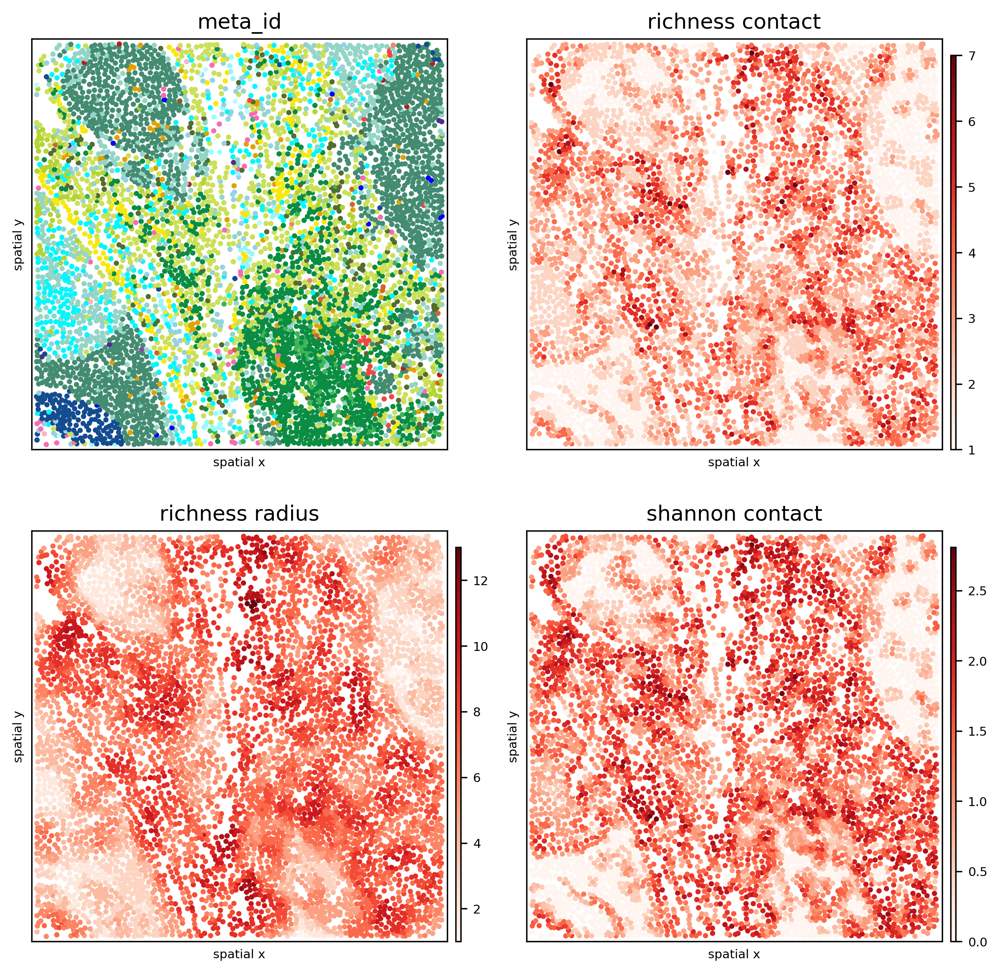

In [13]:
# %% visualise metrics
fig, axs = plt.subplots(2, 2, figsize=(8, 8), dpi=300)
axs = axs.flat

sh.pl.spatial(so, spl, 'meta_id', ax=axs[0], cbar=False)
sh.pl.spatial(so, spl, 'richness_meta_id_contact', ax=axs[1], cbar_title=False)
sh.pl.spatial(so, spl, 'richness_meta_id_radius', ax=axs[3], cbar_title=False)
sh.pl.spatial(so, spl, 'shannon_meta_id_contact', ax=axs[2], cbar_title=False)
for ax, title in zip(axs, ['meta_id', 'richness contact', 'shannon contact', 'richness radius']):
    ax.set_title(title)
# fig.show()

The following histograms demonstrate how different graph representation choices influence the diversity quantification. We observe that cells have in general a higher richness when using a radius graph compared to the contact graph. This is expected as a cell in the radius graph is connected to more neighboring cells than in the contact graph.
Furthermore, we see that in both representations, a single cell has a much lower diversity score than the sample-level estimate.

<ipython-input-14-084bf154ce3b>:9: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


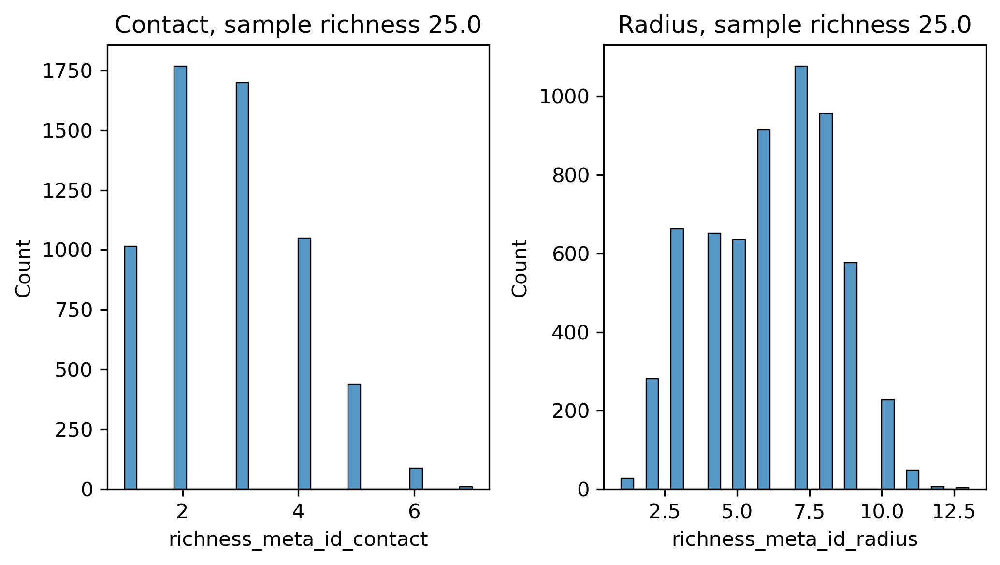

In [14]:
import seaborn as sns

fig, axs = plt.subplots(1, 2, figsize=(7, 4), dpi=300)
sns.histplot(data=so.obs[spl], x='richness_meta_id_contact', ax=axs[0])
axs[0].set_title(f'Contact, sample richness {so.spl.loc[spl].richness_meta_id}')
sns.histplot(data=so.obs[spl], x='richness_meta_id_radius', ax=axs[1])
axs[1].set_title(f'Radius, sample richness {so.spl.loc[spl].richness_meta_id}')
fig.tight_layout()
fig.show()

## Infiltration
The infiltration score was introduced by Keren _et al._ to measure the degree of immune cell infiltration into the tumor mass.

$\text{score}=\frac{N_{it}}{N_{ii}}$

where $N_{it}$ is the number of edges between tumor and immune cells and $N_{ii}$ the number of edges between immune cells.

In [15]:
high_var_samples = ['slide_7_Cy2x2', 'slide_7_Cy2x3', 'slide_7_Cy2x4']
low_var_samples = ['slide_59_Cy7x7', 'slide_59_Cy7x8', 'slide_59_Cy8x1']
spls = high_var_samples + low_var_samples

for s in tqdm(spls):
    sh.neigh.infiltration(so, s, 'cell_type', graph_key='contact')

so.spl.loc[spls].infiltration

100%|██████████| 6/6 [00:00<00:00, 39.58it/s]


core
slide_7_Cy2x2     0.068071
slide_7_Cy2x3     0.117735
slide_7_Cy2x4     0.553333
slide_59_Cy7x7    0.143432
slide_59_Cy7x8    0.195754
slide_59_Cy8x1    0.193103
Name: infiltration, dtype: float64

In the following figure we plot multiple samples from two patients (top: patient 7, bottom: patient 59).
The infiltration score for patient 7 is very heterogeneous and ranging from 0.07 to 0.55. In contrast, patient 59 has an infiltration score around ~0.18.
This example highlights the intra-patient heterogeneity that can be observed and demonstrates that we have to interpret the obtained scores carefully.

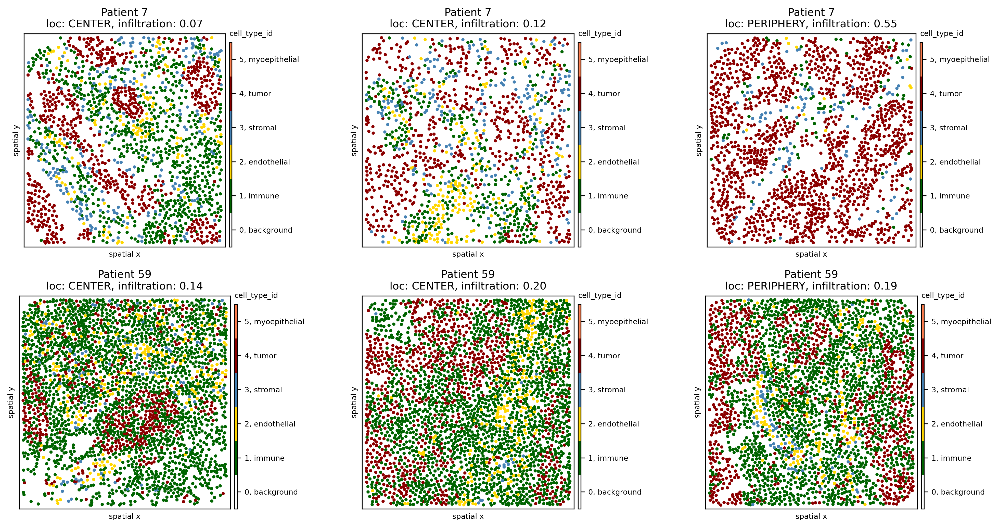

In [16]:
fig, axs = plt.subplots(2, 3, figsize=(14, 7), dpi=300)
for ax, spl in zip(axs.flat, high_var_samples + low_var_samples):
    sh.pl.spatial(so, spl, 'cell_type_id', ax=ax)
    d = so.spl.loc[spl]
    ax.set_title(f'Patient {d.pid}\nloc: {d.location}, infiltration: {d.infiltration:.2f}', fontdict={'size': 10})
# fig.show()

## Phenotype interactions

Interaction strength of pairs-wise phenotypes is computed by observing the number or proportion of interactions a given phenotype has with another phenotype on average across a sample. A permutation test is used to determine whether the observed interaction strength is an  enrichment or depletion.

![interactions.png](img/interactions.png)
<!-- ![interactions-quant.png](interactions-quant.png) -->

The framework implements three different flavours to determine the pair-wise interaction strength between phenotypes.

- classic / [histoCAT](http://www.nature.com/articles/nmeth.4391): Methods developed by the Bodenmiller lab. Estimate the pair-wise interaction strength by counting the number of edges between pair-wise phenotypes.
- proportion: Flavour of the classic method that normalises the number of edges between phenotypes by the total number of edges present and thus bounds the score [0,1]. 

All those methods assess the direction of the interaction (attraction / avoidance) by a permutation test.
This is, the phenotype labels are randomly permuted and the interaction strength recomputed.
This is repeated multiple times to generate a null hypothesis against which the observed interaction strength is compared.
If `prediction_type=pvalue`, we compute P-values for the interaction strength based on the two individual one-tailed permutation tests.
If `prediction_type=diff` the score is simply the difference of the average interaction strength across all permutations and the observed interaction strength.

In the following cell we compute the interaction strength between the `meta_id` phenotypes.

In [17]:
spl = 'slide_49_By2x5'
sh.neigh.interactions(so, spl, 'meta_id', mode='proportion', prediction_type='diff', graph_key='contact')

INFO:root:loading h0 for slide_49_By2x5, graph type contact and mode proportion


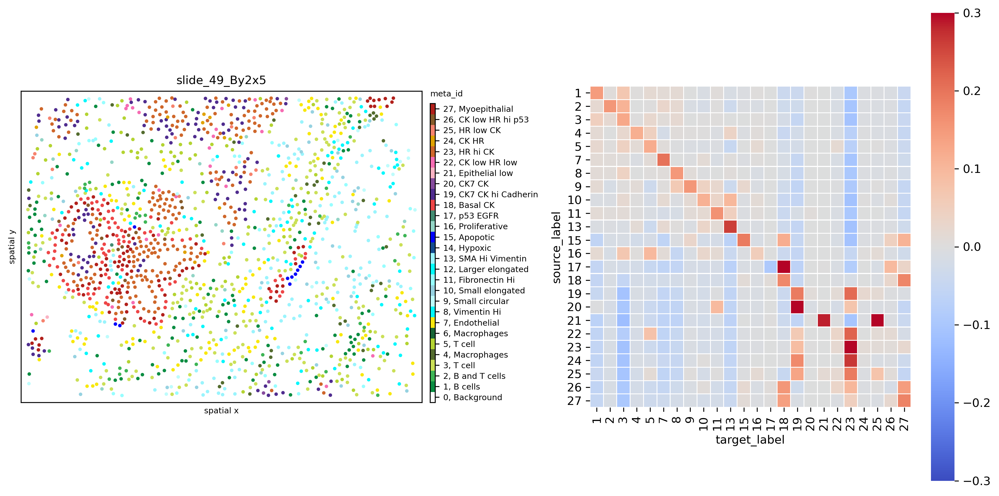

In [18]:
from matplotlib.colors import Normalize

fig, axs = plt.subplots(1, 2, figsize=(12, 6), dpi=300)
norm = Normalize(-.3, .3)

sh.pl.spatial(so, spl, 'meta_id', ax=axs[0])
sh.pl.interactions(so, spl, 'meta_id', mode='proportion', prediction_type='diff', graph_key='contact', ax=axs[1],
                   norm=norm)

fig.tight_layout()
# fig.show()

In the following cell we compute the interaction strength between the `cell_type_id` phenotypes.

INFO:root:loading h0 for slide_49_By2x5, graph type contact and mode proportion


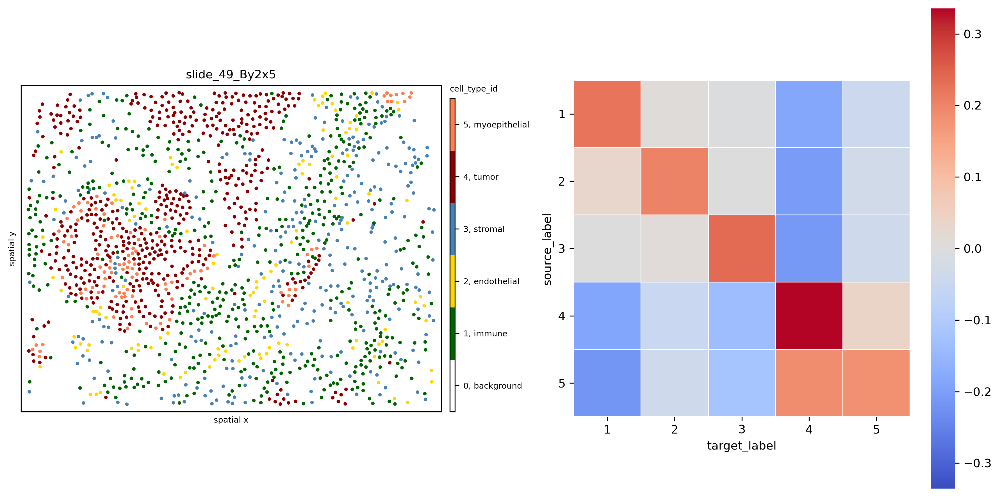

In [21]:
sh.neigh.interactions(so, spl, 'cell_type_id', mode='proportion', prediction_type='diff', graph_key='contact')

fig, axs = plt.subplots(1, 2, figsize=(12, 6), dpi=300)
sh.pl.spatial(so, spl, 'cell_type_id', ax=axs[0])
norm = Normalize(-.3, .3)
sh.pl.interactions(so, spl, 'cell_type_id', mode='proportion', prediction_type='diff', graph_key='contact', ax=axs[1])
fig.tight_layout()
# fig.show()